# BERT Sentiment Classification on the IMDb Dataset

In this notebook, we will use a pre-trained BERT model to classify the [IMDB](http://ai.stanford.edu/~amaas/data/sentiment/) movie reviews into positive or negative. We will further fine-tune the model and compare the performances.

The code is largely based on [this tutorial](https://www.kaggle.com/code/atulanandjha/bert-testing-on-imdb-dataset-extensive-tutorial) on Kaggle by Atul Anand.

The structure of the notebook is as such:

* Setup
* Data preparation
* The BERT model
 * Baseline result on the pre-trained model
 * Result after fine-tuning the BERT model
* Examining attention
  * Attention of a falsely classfied instance
  * Attention of a correctly classfied instance
  * Attention of another correctly classfied instance




# Setup

In [1]:
!pip install pytorch_transformers

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 176.4/176.4 kB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.6/135.6 kB 17.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 36.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 880.6/880.6 kB 64.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.6/79.6 kB 11.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.6/10.6 MB 95.7 MB/s eta 0:00:00
  Created wheel for sacremoses: filename=sacremoses-0.0.53-py3-none-any.whl size=895259 sha256=ec28161ac4c79298f0f988788c18322b771c60ac29d721b470892980b08dcb40
  Stored in directory: /root/.cache/pip/wheels/12/1c/3d/46cf06718d63a32ff798a89594b61e7f345ab6b36d909ce033
Successfully built sacremoses


In [2]:
!pip install Keras-Preprocessing

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 2.0 MB/s eta 0:00:00


In [3]:
!pip install captum

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 19.7 MB/s eta 0:00:00


In [4]:
import sys
import os
import gc
import numpy as np
import random as rn
import pandas as pd
import seaborn as sns
import torch
import tensorflow as tf
from pytorch_transformers import BertTokenizer, BertModel, BertConfig
from torch import nn
from keras_preprocessing.sequence import pad_sequences
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler
from torch.optim import Adam
from torch.nn.utils import clip_grad_norm_
from IPython.display import clear_output
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report
from google.colab import drive 
drive.mount('/content/gdrive')
%matplotlib inline

# from captum.attr import visualization as viz
# from captum.attr import IntegratedGradients, LayerConductance, LayerIntegratedGradients, LayerActivation
# from captum.attr import configure_interpretable_embedding_layer, remove_interpretable_embedding_layer

Mounted at /content/gdrive


In [5]:
rn.seed(123)
np.random.seed(123)
torch.manual_seed(123)
torch.cuda.manual_seed(123)

# Data Preparation




We first load and read the data. Due the hardware limitations, we will only be using 2000 instances for training data (1000 positive and 1000 negative instances) and 500 instances for the test data (250 positive and 250 negative instances).  

In [6]:
train_pos_dir = 'gdrive/My Drive/College/Classes/COMP551/IMDB_dataset/train/pos'
train_neg_dir = 'gdrive/My Drive/College/Classes/COMP551/IMDB_dataset/train/neg'

test_pos_dir = 'gdrive/My Drive/College/Classes/COMP551/IMDB_dataset/test/pos'
test_neg_dir = 'gdrive/My Drive/College/Classes/COMP551/IMDB_dataset/test/neg'

In [7]:
# preparing training data
train_tuples = []

instance_count = 0
for filename in os.listdir(train_pos_dir):
    if instance_count < 1250:
        f = os.path.join(train_pos_dir, filename)
        # checking if it is a file
        if os.path.isfile(f):
            fl = open(f, 'r')
            content = fl.read()
            train_tuples.append((content, "pos"))
            fl.close()
        instance_count += 1

instance_count = 0
for filename in os.listdir(train_neg_dir):
    if instance_count < 1250:
        f = os.path.join(train_neg_dir, filename)
        # checking if it is a file
        if os.path.isfile(f):
            fl = open(f, 'r')
            content = fl.read()
            train_tuples.append((content, "neg"))
            fl.close()
        instance_count += 1

rn.shuffle(train_tuples)

In [8]:
# take a look at the train data
print(len(train_tuples))
train_tuples[0]

2500


("I will never forget this film or the events that lead up to Jonestown in Guyana. It just seems so tragic but needs to be told. Powers Boothe give a commanding performance as the leader Rev. Jim Jones from obscurity until total madness. It would have won him an Academy Award easily if it was released in the movie theaters. It is the kind of mini-series you won't forget. You won't forget the images of the cult's brutality, control, and obsessiveness of it's leader. His rise and fall and the threat from the outside world to destroy what he considered to be paradise. The mass suicide is horrifying, almost unreal to anybody's imagination as to why so many people (900+) went willingly or resisted JOnes' orders. They don't make mini series like these anymore where we're left with out mouths open and hungry to know what happened to the others.",
 'pos')

In [9]:
# separate the data into texts and their labels
train_texts = []
train_labels = []
for tup in train_tuples:
    train_texts.append(tup[0])
    train_labels.append(tup[1])
len(train_texts), len(train_labels)

(2500, 2500)

In [10]:
# preparing test data

test_tuples = []
instance_count = 0

for filename in os.listdir(test_pos_dir):
    if instance_count < 1250:
        f = os.path.join(test_pos_dir, filename)
        # checking if it is a file
        if os.path.isfile(f):
            fl = open(f, 'r')
            content = fl.read()
            test_tuples.append((content, "pos"))
            fl.close()
        instance_count += 1

instance_count = 0
for filename in os.listdir(test_neg_dir):
    if instance_count < 1250:
        f = os.path.join(test_neg_dir, filename)
        # checking if it is a file
        if os.path.isfile(f):
            fl = open(f, 'r')
            content = fl.read()
            test_tuples.append((content, "neg"))
            fl.close()
        instance_count += 1

rn.shuffle(test_tuples)

In [11]:
# take a look at the test data
print(len(test_tuples))
test_tuples[0]

2500


("James Stewart plays Johnny Mason, lawyer. Carole Lombard is Jane Mason, wife. Lucile Watson the mother-in-law Harriet Mason. Johnny sees Jane and quickly marries her. Mother is disappointed. Mother lives with them. Many troubles are ahead. Jane can't cook. Can't set the table. Can't do many things according to mother. The interaction between daughter-in-law and mother are the highlights of this film. Stewart and Lombard are married but just don't have any real magic on screen. Stewart is Stewart. He is good as a timid husband and son but this doesn't carry the film. Can baby Mason build bridges between Jane and Harriet? A believable film for those that are married.",
 'neg')

In [12]:
# separate the data into texts and their labels
test_texts = []
test_labels = []
for tup in test_tuples:
    test_texts.append(tup[0])
    test_labels.append(tup[1])
len(test_texts), len(test_labels)

(2500, 2500)

Now let's tokenize the sentences.

In [13]:
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased', do_lower_case=True)

100%|██████████| 231508/231508 [00:00<00:00, 2797483.54B/s]


In [14]:
train_tokens = list(map(lambda t: ['[CLS]'] + tokenizer.tokenize(t)[:510] + ['[SEP]'], train_texts))
test_tokens = list(map(lambda t: ['[CLS]'] + tokenizer.tokenize(t)[:510] + ['[SEP]'], test_texts))

len(train_tokens), len(test_tokens)

(2500, 2500)

In [15]:
train_tokens[0]

['[CLS]',
 'i',
 'will',
 'never',
 'forget',
 'this',
 'film',
 'or',
 'the',
 'events',
 'that',
 'lead',
 'up',
 'to',
 'jones',
 '##town',
 'in',
 'guyana',
 '.',
 'it',
 'just',
 'seems',
 'so',
 'tragic',
 'but',
 'needs',
 'to',
 'be',
 'told',
 '.',
 'powers',
 'booth',
 '##e',
 'give',
 'a',
 'commanding',
 'performance',
 'as',
 'the',
 'leader',
 'rev',
 '.',
 'jim',
 'jones',
 'from',
 'ob',
 '##scu',
 '##rity',
 'until',
 'total',
 'madness',
 '.',
 'it',
 'would',
 'have',
 'won',
 'him',
 'an',
 'academy',
 'award',
 'easily',
 'if',
 'it',
 'was',
 'released',
 'in',
 'the',
 'movie',
 'theaters',
 '.',
 'it',
 'is',
 'the',
 'kind',
 'of',
 'mini',
 '-',
 'series',
 'you',
 'won',
 "'",
 't',
 'forget',
 '.',
 'you',
 'won',
 "'",
 't',
 'forget',
 'the',
 'images',
 'of',
 'the',
 'cult',
 "'",
 's',
 'brutality',
 ',',
 'control',
 ',',
 'and',
 'ob',
 '##ses',
 '##sive',
 '##ness',
 'of',
 'it',
 "'",
 's',
 'leader',
 '.',
 'his',
 'rise',
 'and',
 'fall',
 'and',


In [16]:
# make every instance have the same numbers of tokens
train_tokens_ids = pad_sequences(list(map(tokenizer.convert_tokens_to_ids, train_tokens)), 
                                 maxlen=512, truncating="post", padding="post", dtype="int")
test_tokens_ids = pad_sequences(list(map(tokenizer.convert_tokens_to_ids, test_tokens)), 
                                maxlen=512, truncating="post", padding="post", dtype="int")

train_tokens_ids.shape, test_tokens_ids.shape

((2500, 512), (2500, 512))

In [17]:
train_tokens_ids[0]

array([  101,  1045,  2097,  2196,  5293,  2023,  2143,  2030,  1996,
        2824,  2008,  2599,  2039,  2000,  3557,  4665,  1999, 18786,
        1012,  2009,  2074,  3849,  2061, 13800,  2021,  3791,  2000,
        2022,  2409,  1012,  4204,  9065,  2063,  2507,  1037,  7991,
        2836,  2004,  1996,  3003,  7065,  1012,  3958,  3557,  2013,
       27885, 28817, 15780,  2127,  2561, 12013,  1012,  2009,  2052,
        2031,  2180,  2032,  2019,  2914,  2400,  4089,  2065,  2009,
        2001,  2207,  1999,  1996,  3185, 12370,  1012,  2009,  2003,
        1996,  2785,  1997,  7163,  1011,  2186,  2017,  2180,  1005,
        1056,  5293,  1012,  2017,  2180,  1005,  1056,  5293,  1996,
        4871,  1997,  1996,  8754,  1005,  1055, 24083,  1010,  2491,
        1010,  1998, 27885,  8583, 12742,  2791,  1997,  2009,  1005,
        1055,  3003,  1012,  2010,  4125,  1998,  2991,  1998,  1996,
        5081,  2013,  1996,  2648,  2088,  2000,  6033,  2054,  2002,
        2641,  2000,

In [18]:
# convert the labels into numpy arrays
train_y = np.array(train_labels) == 'pos'
test_y = np.array(test_labels) == 'pos'
train_y.shape, test_y.shape, np.mean(train_y), np.mean(test_y)

((2500,), (2500,), 0.5, 0.5)

In [19]:
train_y[0], test_y[0]

(True, False)

Now we will mask a few random IDs from each sentence to remove biasness.

In [20]:
train_masks = [[float(i > 0) for i in ii] for ii in train_tokens_ids]
test_masks = [[float(i > 0) for i in ii] for ii in test_tokens_ids]

# The BERT model

In this section, we will load a pre-trained BERT model and see how it performs on the IMDB dataset.

In [21]:
class BertBinaryClassifier(nn.Module):
    def __init__(self, dropout=0.1):
        super(BertBinaryClassifier, self).__init__()
        self.bert = BertModel.from_pretrained('bert-base-uncased', output_attentions=True)
        self.dropout = nn.Dropout(dropout)
        self.linear = nn.Linear(768, 1)
        self.sigmoid = nn.Sigmoid()
    
    def forward(self, tokens, masks=None):
        _, pooled_output, attn = self.bert(tokens, attention_mask=masks) 
        self.attn = attn
        dropout_output = self.dropout(pooled_output)
        linear_output = self.linear(dropout_output)
        proba = self.sigmoid(linear_output)
        return proba

## Baseline result on the pre-trained model

Let's see the performance of the pre-trained BERT model on the IMDB dataset.

In [22]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [23]:
bert_clf = BertBinaryClassifier()
bert_clf = bert_clf.cuda()     # running BERT on CUDA_GPU

100%|██████████| 440473133/440473133 [00:05<00:00, 74058865.03B/s]


In [24]:
y, x, pooled = None, None, None
torch.cuda.empty_cache() 

In [25]:
BATCH_SIZE = 3

In [26]:
test_tokens_tensor = torch.tensor(test_tokens_ids)
test_y_tensor = torch.tensor(test_y.reshape(-1, 1)).float()
test_masks_tensor = torch.tensor(test_masks)

In [27]:
test_dataset = TensorDataset(test_tokens_tensor, test_masks_tensor, test_y_tensor)
test_sampler = SequentialSampler(test_dataset)
test_dataloader = DataLoader(test_dataset, sampler=test_sampler, batch_size=BATCH_SIZE)

In [28]:
torch.cuda.empty_cache()   # Clearing Cache space for a fresh Model run

In [29]:
bert_clf.eval()
bert_predicted = []
all_logits = []
with torch.no_grad():
    for step_num, batch_data in enumerate(test_dataloader):

        token_ids, masks, labels = tuple(t.to(device) for t in batch_data)

        logits = bert_clf(token_ids, masks)
        loss_func = nn.BCELoss()
        loss = loss_func(logits, labels)
        numpy_logits = logits.cpu().detach().numpy()
        
        bert_predicted += list(numpy_logits[:, 0] > 0.5)
        all_logits += list(numpy_logits[:, 0])

In [30]:
print(classification_report(test_y, bert_predicted))

              precision    recall  f1-score   support

       False       0.45      0.44      0.45      1250
        True       0.46      0.48      0.47      1250

    accuracy                           0.46      2500
   macro avg       0.46      0.46      0.46      2500
weighted avg       0.46      0.46      0.46      2500



The accuracy of the model is 46%, which is very low.

## Result after fine-tuning the BERT model

We will train the model for 5 epochs.

In [31]:
BATCH_SIZE = 3
EPOCHS = 5

In [32]:
train_tokens_tensor = torch.tensor(train_tokens_ids)
train_y_tensor = torch.tensor(train_y.reshape(-1, 1)).float()

test_tokens_tensor = torch.tensor(test_tokens_ids)
test_y_tensor = torch.tensor(test_y.reshape(-1, 1)).float()

train_masks_tensor = torch.tensor(train_masks)
test_masks_tensor = torch.tensor(test_masks)

In [33]:
train_dataset = TensorDataset(train_tokens_tensor, train_masks_tensor, train_y_tensor)
train_sampler = RandomSampler(train_dataset)
train_dataloader = DataLoader(train_dataset, sampler=train_sampler, batch_size=BATCH_SIZE)

test_dataset = TensorDataset(test_tokens_tensor, test_masks_tensor, test_y_tensor)
test_sampler = SequentialSampler(test_dataset)
test_dataloader = DataLoader(test_dataset, sampler=test_sampler, batch_size=BATCH_SIZE)

In [34]:
param_optimizer = list(bert_clf.sigmoid.named_parameters()) 
optimizer_grouped_parameters = [{"params": [p for n, p in param_optimizer]}]

In [35]:
optimizer = Adam(bert_clf.parameters(), lr=3e-6)

In [36]:
torch.cuda.empty_cache()   # Clearing Cache space for a fresh Model run

In [37]:
train_losses = []

for epoch_num in range(EPOCHS):
    bert_clf.train()
    train_loss = 0
    for step_num, batch_data in enumerate(train_dataloader):
        token_ids, masks, labels = tuple(t.to(device) for t in batch_data)
        print(str(torch.cuda.memory_allocated(device)/1000000 ) + 'M')
        logits = bert_clf(token_ids, masks)
        
        loss_func = nn.BCELoss()

        batch_loss = loss_func(logits, labels)
        train_loss += batch_loss.item()
        
        
        bert_clf.zero_grad()
        batch_loss.backward()
        

        clip_grad_norm_(parameters=bert_clf.parameters(), max_norm=1.0)
        optimizer.step()
        train_losses.append(train_loss)
        
        clear_output(wait=True)
        print('Epoch: ', epoch_num + 1)
        print("\r" + "{0}/{1} loss: {2} ".format(step_num, len(train_texts) / BATCH_SIZE, train_loss / (step_num + 1)))

Epoch:  5
833/833.3333333333334 loss: 0.10069942867713623 


In [270]:
bert_clf.eval()
bert_predicted = []
all_logits = []
first_attentions = []
i = 0

with torch.no_grad():
    for step_num, batch_data in enumerate(test_dataloader):

        token_ids, masks, labels = tuple(t.to(device) for t in batch_data)

        # the code here is just to extract the first few attentions in the test set
        if i < 3: # i is the index of the batch of attentions we want to get
            first_attentions.append(bert_clf.attn)

        logits = bert_clf(token_ids, masks)

        loss_func = nn.BCELoss()
        loss = loss_func(logits, labels)
        numpy_logits = logits.cpu().detach().numpy()
        
        bert_predicted += list(numpy_logits[:, 0] > 0.5)
        all_logits += list(numpy_logits[:, 0])
        i+=1

In [179]:
print(classification_report(test_y, bert_predicted))

              precision    recall  f1-score   support

       False       0.93      0.86      0.90      1250
        True       0.87      0.94      0.90      1250

    accuracy                           0.90      2500
   macro avg       0.90      0.90      0.90      2500
weighted avg       0.90      0.90      0.90      2500



The BERT model after fine-tuning achieved 90% accuracy. 

# Examining attention

In this section, we will look at some attention matrices to understand how the tokens influence one another. 

Reference: https://captum.ai/tutorials/Bert_SQUAD_Interpret2 

The dimensions of the output attention is interpreted as such:

In [180]:
print("Number of layers in BERT: ", len(bert_clf.attn))
print("Number of batches: ", len(bert_clf.attn[0]))
print("Number of heads in each layer: ", len(bert_clf.attn[0][0]))
print(f"Dimension of a single attention matrix for a sentence: ({len(bert_clf.attn[0][0][0])}, {len(bert_clf.attn[0][0][0][0])})")

Number of layers in BERT:  12
Number of batches:  1
Number of heads in each layer:  12
Dimension of a single attention matrix for a sentence: (512, 512)


Let's examine the attention matrices of a falsely classfied instance and a correctly classified instance.

In [181]:
test_y[:10].tolist(), bert_predicted[:10]

([False, False, False, True, True, True, False, True, True, True],
 [True, False, True, True, True, True, False, True, True, True])

As you can see, the first instance in the test set is falsely classfied. The second instance is correctly classfied. Let's take a look at these two instances. Let's first define a helper function:

In [183]:
def visualize_token2token_scores(scores_mat, where_in_batch, x_label_name='Head'):
    fig = plt.figure(figsize=(70, 70))

    for idx, scores in enumerate(scores_mat[where_in_batch]):

        len_all_tokens = len(all_tokens)

        # get rid of the paddings' attention
        k = scores.tolist()
        k = k[:len_all_tokens]
    
        for i in range(len_all_tokens):
            k[i] = k[i][:len_all_tokens]
        scores = np.asarray(k)

        ax = fig.add_subplot(4, 3, idx+1)
        # append the attention weights
        im = ax.imshow(scores, cmap='viridis')

        fontdict = {'fontsize': 10}

        ax.set_xticks(range(len_all_tokens))
        ax.set_yticks(range(len_all_tokens))

        ax.set_xticklabels(all_tokens, fontdict=fontdict, rotation=90)
        ax.set_yticklabels(all_tokens, fontdict=fontdict)
        ax.set_xlabel('{} {}'.format(x_label_name, idx+1), fontsize=20)

        fig.colorbar(im, fraction=0.046, pad=0.04)
        
    plt.tight_layout()
    plt.show()

As in the comments in the block of code on evaluating the model, we extracted the first three batches' attention matrices.

In [271]:
len(first_attentions)

3

The first batch contains one attention matrix which doesn't belong to any instance. I think it's the initialized one.

In [185]:
output_attentions_all = torch.stack(first_attentions[0])
output_attentions_all.shape

torch.Size([12, 1, 12, 512, 512])

The second batch contains the attention matrices of the first three instances.

In [186]:
output_attentions_all = torch.stack(first_attentions[1])
output_attentions_all.shape

torch.Size([12, 3, 12, 512, 512])

## Attention of a falsely classfied instance

We will look at instance 1, its orginal text and its encoded IDs. Instance 1 is negative according to the true label. However, the model classified it as positive.

In [234]:
test_texts[0]

"James Stewart plays Johnny Mason, lawyer. Carole Lombard is Jane Mason, wife. Lucile Watson the mother-in-law Harriet Mason. Johnny sees Jane and quickly marries her. Mother is disappointed. Mother lives with them. Many troubles are ahead. Jane can't cook. Can't set the table. Can't do many things according to mother. The interaction between daughter-in-law and mother are the highlights of this film. Stewart and Lombard are married but just don't have any real magic on screen. Stewart is Stewart. He is good as a timid husband and son but this doesn't carry the film. Can baby Mason build bridges between Jane and Harriet? A believable film for those that are married."

In [235]:
test_tokens_ids[0]

array([  101,  2508,  5954,  3248,  5206,  6701,  1010,  5160,  1012,
       24348, 23441,  2003,  4869,  6701,  1010,  2564,  1012, 12776,
        9463,  7908,  1996,  2388,  1011,  1999,  1011,  2375, 14207,
        6701,  1012,  5206,  5927,  4869,  1998,  2855, 19941,  2014,
        1012,  2388,  2003,  9364,  1012,  2388,  3268,  2007,  2068,
        1012,  2116, 13460,  2024,  3805,  1012,  4869,  2064,  1005,
        1056,  5660,  1012,  2064,  1005,  1056,  2275,  1996,  2795,
        1012,  2064,  1005,  1056,  2079,  2116,  2477,  2429,  2000,
        2388,  1012,  1996,  8290,  2090,  2684,  1011,  1999,  1011,
        2375,  1998,  2388,  2024,  1996, 11637,  1997,  2023,  2143,
        1012,  5954,  1998, 23441,  2024,  2496,  2021,  2074,  2123,
        1005,  1056,  2031,  2151,  2613,  3894,  2006,  3898,  1012,
        5954,  2003,  5954,  1012,  2002,  2003,  2204,  2004,  1037,
        5199,  3593,  3129,  1998,  2365,  2021,  2023,  2987,  1005,
        1056,  4287,

In [236]:
# get rid of the paddings (the zeros)
tokens_to_examine = np.delete(test_tokens_ids[0], np.where(test_tokens_ids[0] == 0)) 

In [237]:
len(tokens_to_examine)

153

In [238]:
# convert the IDs back to words for better visualization
all_tokens = tokenizer.convert_ids_to_tokens(tokens_to_examine) 

In [239]:
all_tokens

['[CLS]',
 'james',
 'stewart',
 'plays',
 'johnny',
 'mason',
 ',',
 'lawyer',
 '.',
 'carole',
 'lombard',
 'is',
 'jane',
 'mason',
 ',',
 'wife',
 '.',
 'luc',
 '##ile',
 'watson',
 'the',
 'mother',
 '-',
 'in',
 '-',
 'law',
 'harriet',
 'mason',
 '.',
 'johnny',
 'sees',
 'jane',
 'and',
 'quickly',
 'marries',
 'her',
 '.',
 'mother',
 'is',
 'disappointed',
 '.',
 'mother',
 'lives',
 'with',
 'them',
 '.',
 'many',
 'troubles',
 'are',
 'ahead',
 '.',
 'jane',
 'can',
 "'",
 't',
 'cook',
 '.',
 'can',
 "'",
 't',
 'set',
 'the',
 'table',
 '.',
 'can',
 "'",
 't',
 'do',
 'many',
 'things',
 'according',
 'to',
 'mother',
 '.',
 'the',
 'interaction',
 'between',
 'daughter',
 '-',
 'in',
 '-',
 'law',
 'and',
 'mother',
 'are',
 'the',
 'highlights',
 'of',
 'this',
 'film',
 '.',
 'stewart',
 'and',
 'lombard',
 'are',
 'married',
 'but',
 'just',
 'don',
 "'",
 't',
 'have',
 'any',
 'real',
 'magic',
 'on',
 'screen',
 '.',
 'stewart',
 'is',
 'stewart',
 '.',
 'he',
 'i

In [240]:
len(all_tokens)

153

In [241]:
# stack the output attention in order to move everything into a tensor
# shape -> layer x batch x head x seq_len x seq_len
output_attentions_all = torch.stack(first_attentions[1])

In [242]:
output_attentions_all.shape

torch.Size([12, 3, 12, 512, 512])

In [248]:
# confirm that the attention we are using is the right one
target_attention_array = output_attentions_all[11][0][0][0].cpu().numpy()
no_zeros_attention = np.delete(target_attention_array, np.where(target_attention_array == 0))
len(no_zeros_attention)

153

Let's choose the final layer to look at.

In [249]:
layer = 11

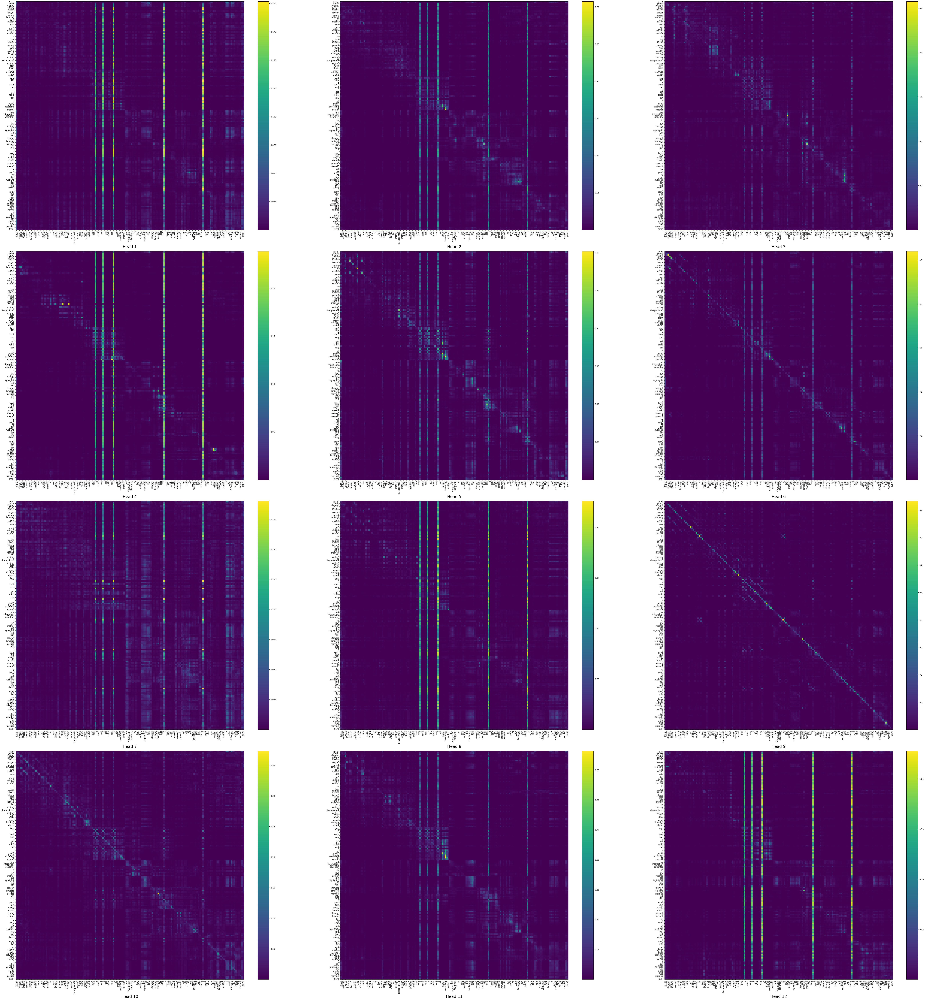

In [250]:
# visualize_token2token_scores(output_attentions_all[layer].squeeze().detach().cpu().numpy())
visualize_token2token_scores(output_attentions_all[layer].detach().cpu().numpy(), 0)

Now let's look at the second to last layer to see how the attention matrices have changed.

In [251]:
layer = 10

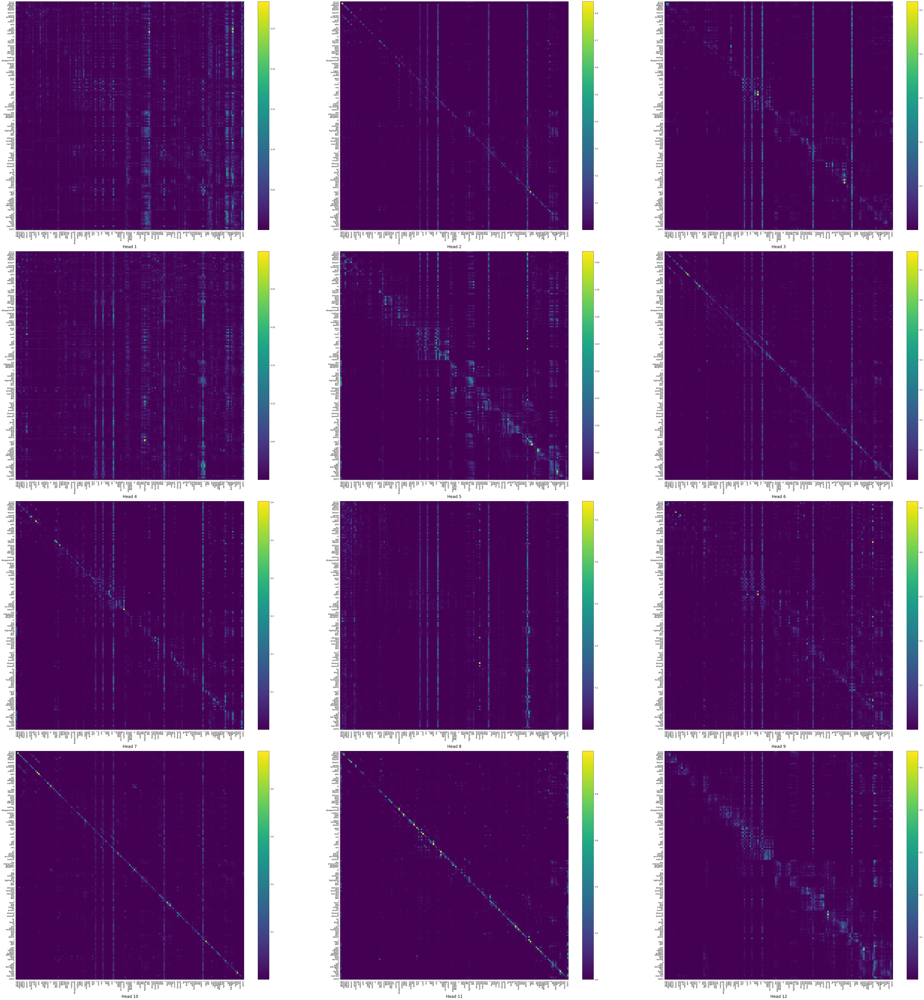

In [252]:
visualize_token2token_scores(output_attentions_all[layer].detach().cpu().numpy(), 0)

Let's examine the first row of the first head; i.e., the attention scores between the class token and words in the first head (of the last layer). 

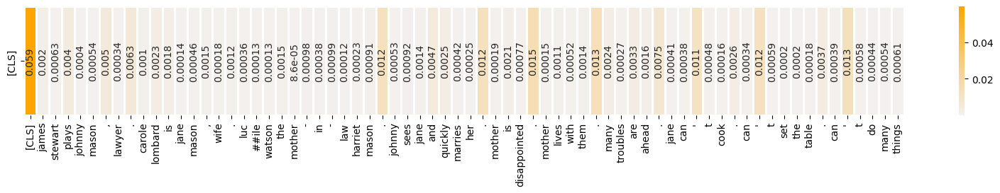

In [253]:
# only the first 70 tokens
plt.figure(figsize=(20,2))
sns.heatmap(first_attentions[1][11][0][0][0][:70].view(1,-1).cpu().detach().numpy(), annot=True, 
            cmap=sns.light_palette('orange', as_cmap=True), linewidths=1,
            xticklabels=all_tokens[:70], yticklabels=all_tokens[0:1], annot_kws={'rotation': 90})
plt.show()

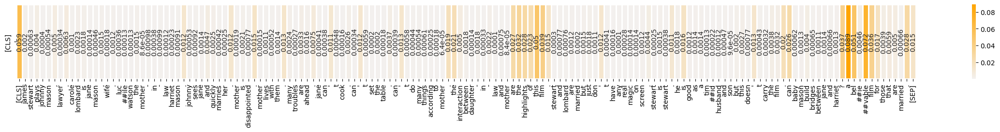

In [254]:
# all tokens
plt.figure(figsize=(30,2))
sns.heatmap(first_attentions[1][11][0][0][0][:len(all_tokens)].view(1,-1).cpu().detach().numpy(), annot=True, 
            cmap=sns.light_palette('orange', as_cmap=True), linewidths=1,
            xticklabels=all_tokens[:len(all_tokens)], yticklabels=all_tokens[0:1], annot_kws={'rotation': 90})
plt.show()

## Attention of a correctly classfied instance

We will be looking at instance 2. BERT correctly classified this instance as negative.

In [255]:
test_texts[1]

"Bad editing, bad production values, bad continuity, implausible, bad dialogue... this movies is bad, bad, bad. However, if you want a movie to poke fun at (a la MST3000), this is your movie. I wouldn't suggest spending much money on it, but if you do see this movie, make sure it's with plenty of witty, like-minded buddies."

In [256]:
test_tokens_ids[1]

array([  101,  2919,  9260,  1010,  2919,  2537,  5300,  1010,  2919,
       13717,  1010, 17727, 28128,  7028,  1010,  2919,  7982,  1012,
        1012,  1012,  2023,  5691,  2003,  2919,  1010,  2919,  1010,
        2919,  1012,  2174,  1010,  2065,  2017,  2215,  1037,  3185,
        2000, 26202,  4569,  2012,  1006,  1037,  2474,  5796,  2102,
       14142,  8889,  1007,  1010,  2023,  2003,  2115,  3185,  1012,
        1045,  2876,  1005,  1056,  6592,  5938,  2172,  2769,  2006,
        2009,  1010,  2021,  2065,  2017,  2079,  2156,  2023,  3185,
        1010,  2191,  2469,  2009,  1005,  1055,  2007,  7564,  1997,
       25591,  1010,  2066,  1011, 13128, 24115,  1012,   102,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,

In [257]:
# get rid of the paddings (the zeros)
tokens_to_examine = np.delete(test_tokens_ids[1], np.where(test_tokens_ids[1] == 0)) 

In [258]:
len(tokens_to_examine)

89

In [259]:
# convert the IDs back to words for better visualization
all_tokens = tokenizer.convert_ids_to_tokens(tokens_to_examine) 

In [260]:
all_tokens

['[CLS]',
 'bad',
 'editing',
 ',',
 'bad',
 'production',
 'values',
 ',',
 'bad',
 'continuity',
 ',',
 'imp',
 '##laus',
 '##ible',
 ',',
 'bad',
 'dialogue',
 '.',
 '.',
 '.',
 'this',
 'movies',
 'is',
 'bad',
 ',',
 'bad',
 ',',
 'bad',
 '.',
 'however',
 ',',
 'if',
 'you',
 'want',
 'a',
 'movie',
 'to',
 'poke',
 'fun',
 'at',
 '(',
 'a',
 'la',
 'ms',
 '##t',
 '##30',
 '##00',
 ')',
 ',',
 'this',
 'is',
 'your',
 'movie',
 '.',
 'i',
 'wouldn',
 "'",
 't',
 'suggest',
 'spending',
 'much',
 'money',
 'on',
 'it',
 ',',
 'but',
 'if',
 'you',
 'do',
 'see',
 'this',
 'movie',
 ',',
 'make',
 'sure',
 'it',
 "'",
 's',
 'with',
 'plenty',
 'of',
 'witty',
 ',',
 'like',
 '-',
 'minded',
 'buddies',
 '.',
 '[SEP]']

In [261]:
len(all_tokens)

89

In [262]:
# stack the output attention in order to move everything into a tensor
# shape -> layer x batch x head x seq_len x seq_len
output_attentions_all = torch.stack(first_attentions[1])

In [263]:
output_attentions_all.shape

torch.Size([12, 3, 12, 512, 512])

In [264]:
# confirm that the attention we are using is the right one
target_attention_array = output_attentions_all[11][1][0][0].cpu().numpy()
no_zeros_attention = np.delete(target_attention_array, np.where(target_attention_array == 0))
len(no_zeros_attention)

89

Let's choose the final layer to look at.

In [265]:
layer = 11

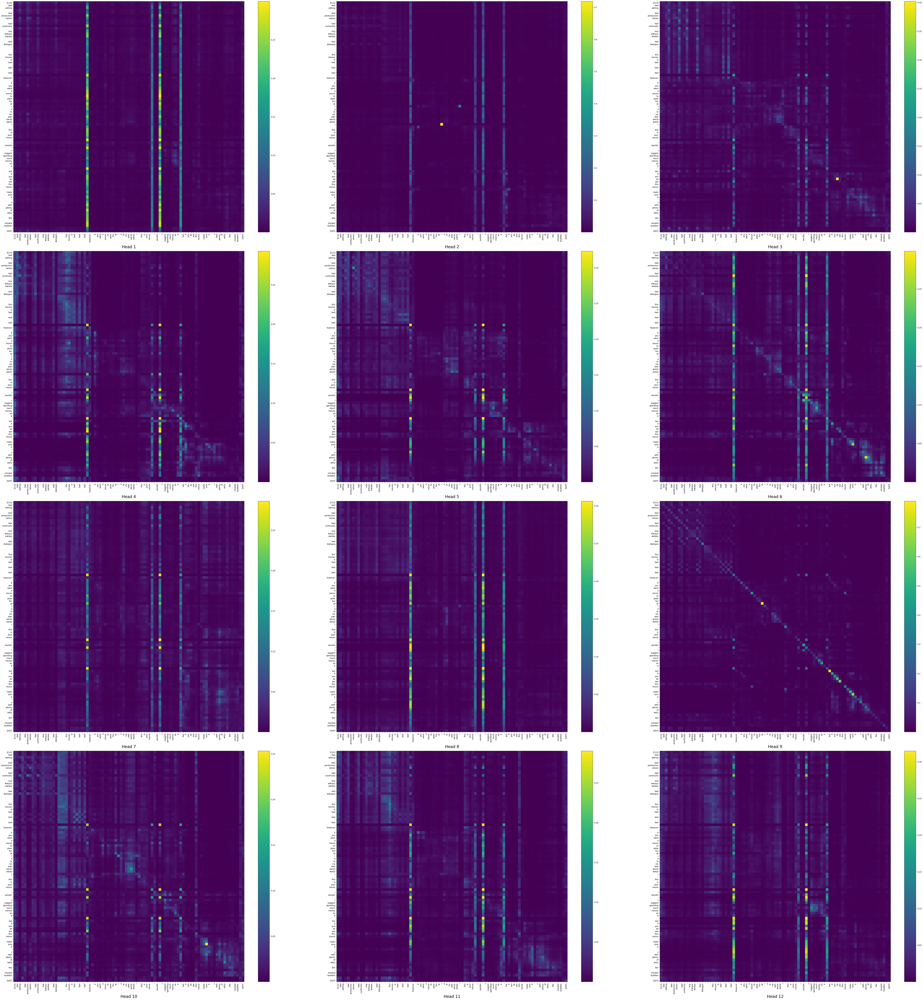

In [266]:
# visualize_token2token_scores(output_attentions_all[layer].squeeze().detach().cpu().numpy())
visualize_token2token_scores(output_attentions_all[layer].detach().cpu().numpy(), 1)

Now let's look at the second to last layer to see how the attention matrices have changed.

In [ ]:
layer = 10

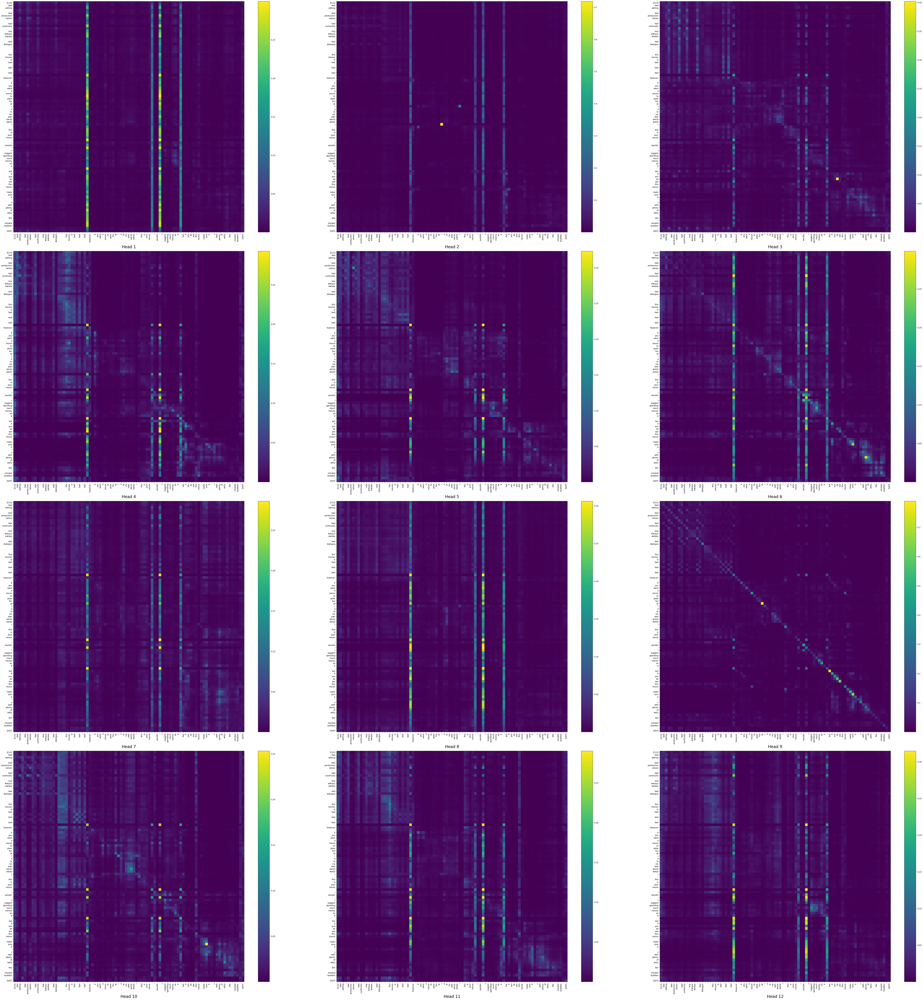

In [267]:
visualize_token2token_scores(output_attentions_all[layer].detach().cpu().numpy(), 1)

Let's examine the first row of the first head; i.e., the attention scores between the class token and words in the first head (of the last layer). 

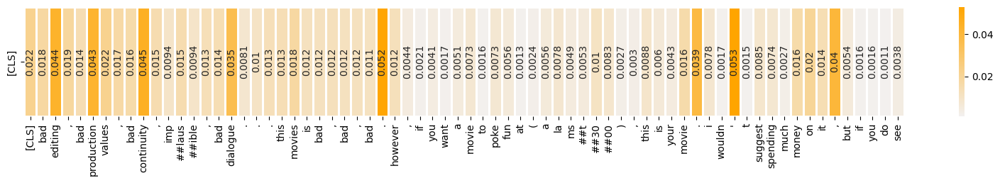

In [269]:
# only the first 70 tokens
plt.figure(figsize=(20,2))
sns.heatmap(first_attentions[1][11][1][0][0][:70].view(1,-1).cpu().detach().numpy(), annot=True, 
            cmap=sns.light_palette('orange', as_cmap=True), linewidths=1,
            xticklabels=all_tokens[:70], yticklabels=all_tokens[0:1], annot_kws={'rotation': 90})
plt.show()

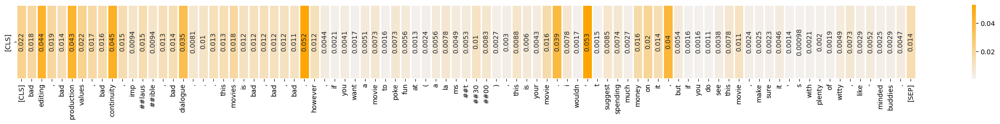

In [268]:
# all tokens
plt.figure(figsize=(30,2))
sns.heatmap(first_attentions[1][11][1][0][0][:len(all_tokens)].view(1,-1).cpu().detach().numpy(), annot=True, 
            cmap=sns.light_palette('orange', as_cmap=True), linewidths=1,
            xticklabels=all_tokens[:len(all_tokens)], yticklabels=all_tokens[0:1], annot_kws={'rotation': 90})
plt.show()

## Attention of another correctly classfied instance

We will be looking at instance 4. BERT correctly classified this instance as positive.

In [272]:
test_texts[3]

"I really liked this movie. If other people want to give it an average around 5.0/10 that's their choice. I would give it 10/10. Sutherland's performance as a private eye is totally awesome. The story is amazing, human, exciting, intelligent. The dialogue is good. The story might not be perfect but anyway - the mood of the movie is good enough to compensate for that. Moreover, the ending is incredibly cool and their the jig-saw puzzle really comes back to together. So anyway I liked it. I also thought the female lead actress performed very well. I'm not a big fan of detective movies but this one was really good, also because it doesn't give a damn about conventions of the supernatural."

In [273]:
test_tokens_ids[3]

array([  101,  1045,  2428,  4669,  2023,  3185,  1012,  2065,  2060,
        2111,  2215,  2000,  2507,  2009,  2019,  2779,  2105,  1019,
        1012,  1014,  1013,  2184,  2008,  1005,  1055,  2037,  3601,
        1012,  1045,  2052,  2507,  2009,  2184,  1013,  2184,  1012,
       14274,  1005,  1055,  2836,  2004,  1037,  2797,  3239,  2003,
        6135, 12476,  1012,  1996,  2466,  2003,  6429,  1010,  2529,
        1010, 10990,  1010,  9414,  1012,  1996,  7982,  2003,  2204,
        1012,  1996,  2466,  2453,  2025,  2022,  3819,  2021,  4312,
        1011,  1996,  6888,  1997,  1996,  3185,  2003,  2204,  2438,
        2000, 19079,  2005,  2008,  1012,  9308,  1010,  1996,  4566,
        2003, 11757,  4658,  1998,  2037,  1996, 10147,  2290,  1011,
        2387, 11989,  2428,  3310,  2067,  2000,  2362,  1012,  2061,
        4312,  1045,  4669,  2009,  1012,  1045,  2036,  2245,  1996,
        2931,  2599,  3883,  2864,  2200,  2092,  1012,  1045,  1005,
        1049,  2025,

In [274]:
# get rid of the paddings (the zeros)
tokens_to_examine = np.delete(test_tokens_ids[3], np.where(test_tokens_ids[3] == 0)) 

In [275]:
len(tokens_to_examine)

157

In [276]:
# convert the IDs back to words for better visualization
all_tokens = tokenizer.convert_ids_to_tokens(tokens_to_examine) 

In [277]:
all_tokens

['[CLS]',
 'i',
 'really',
 'liked',
 'this',
 'movie',
 '.',
 'if',
 'other',
 'people',
 'want',
 'to',
 'give',
 'it',
 'an',
 'average',
 'around',
 '5',
 '.',
 '0',
 '/',
 '10',
 'that',
 "'",
 's',
 'their',
 'choice',
 '.',
 'i',
 'would',
 'give',
 'it',
 '10',
 '/',
 '10',
 '.',
 'sutherland',
 "'",
 's',
 'performance',
 'as',
 'a',
 'private',
 'eye',
 'is',
 'totally',
 'awesome',
 '.',
 'the',
 'story',
 'is',
 'amazing',
 ',',
 'human',
 ',',
 'exciting',
 ',',
 'intelligent',
 '.',
 'the',
 'dialogue',
 'is',
 'good',
 '.',
 'the',
 'story',
 'might',
 'not',
 'be',
 'perfect',
 'but',
 'anyway',
 '-',
 'the',
 'mood',
 'of',
 'the',
 'movie',
 'is',
 'good',
 'enough',
 'to',
 'compensate',
 'for',
 'that',
 '.',
 'moreover',
 ',',
 'the',
 'ending',
 'is',
 'incredibly',
 'cool',
 'and',
 'their',
 'the',
 'ji',
 '##g',
 '-',
 'saw',
 'puzzle',
 'really',
 'comes',
 'back',
 'to',
 'together',
 '.',
 'so',
 'anyway',
 'i',
 'liked',
 'it',
 '.',
 'i',
 'also',
 'though

In [281]:
len(all_tokens)

157

In [278]:
# stack the output attention in order to move everything into a tensor
# shape -> layer x batch x head x seq_len x seq_len
output_attentions_all = torch.stack(first_attentions[2])

In [279]:
output_attentions_all.shape

torch.Size([12, 3, 12, 512, 512])

In [280]:
# confirm that the attention we are using is the right one
target_attention_array = output_attentions_all[11][0][0][0].cpu().numpy()
no_zeros_attention = np.delete(target_attention_array, np.where(target_attention_array == 0))
len(no_zeros_attention)

157

Let's choose the final layer to look at.

In [282]:
layer = 11

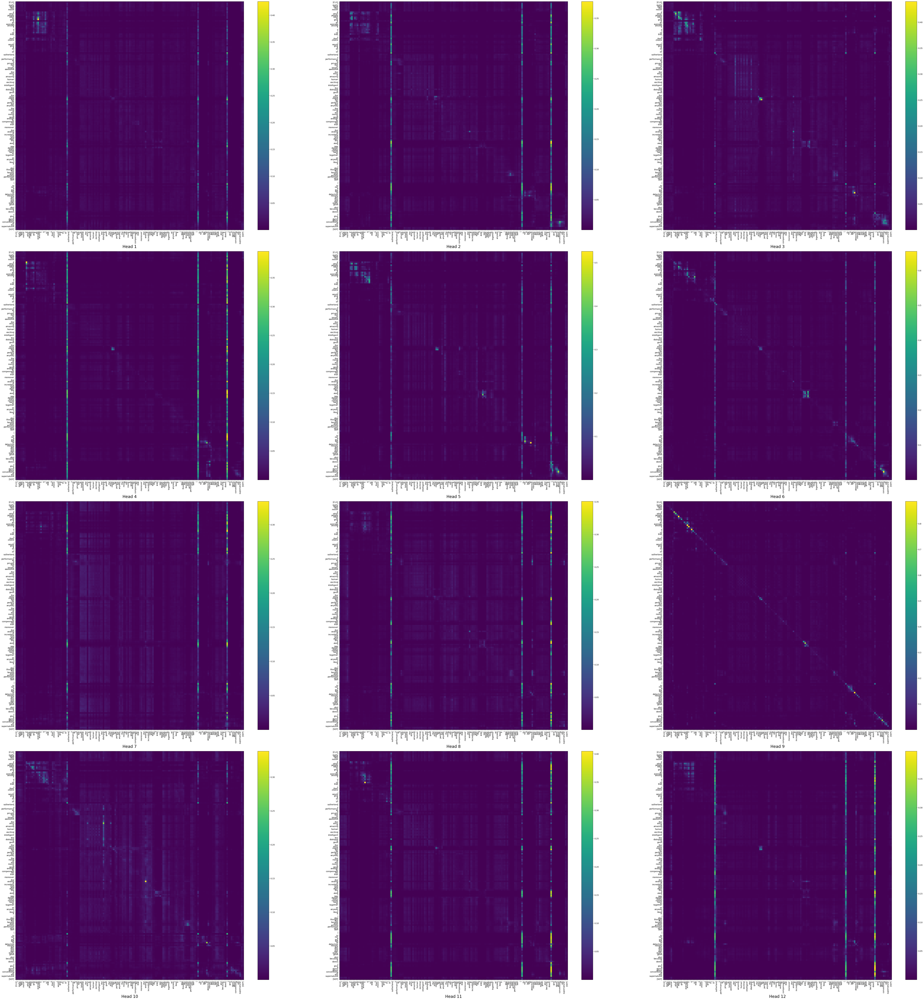

In [284]:
# visualize_token2token_scores(output_attentions_all[layer].squeeze().detach().cpu().numpy())
visualize_token2token_scores(output_attentions_all[layer].detach().cpu().numpy(), 0)

Now let's look at the second to last layer to see how the attention matrices have changed.

In [285]:
layer = 10

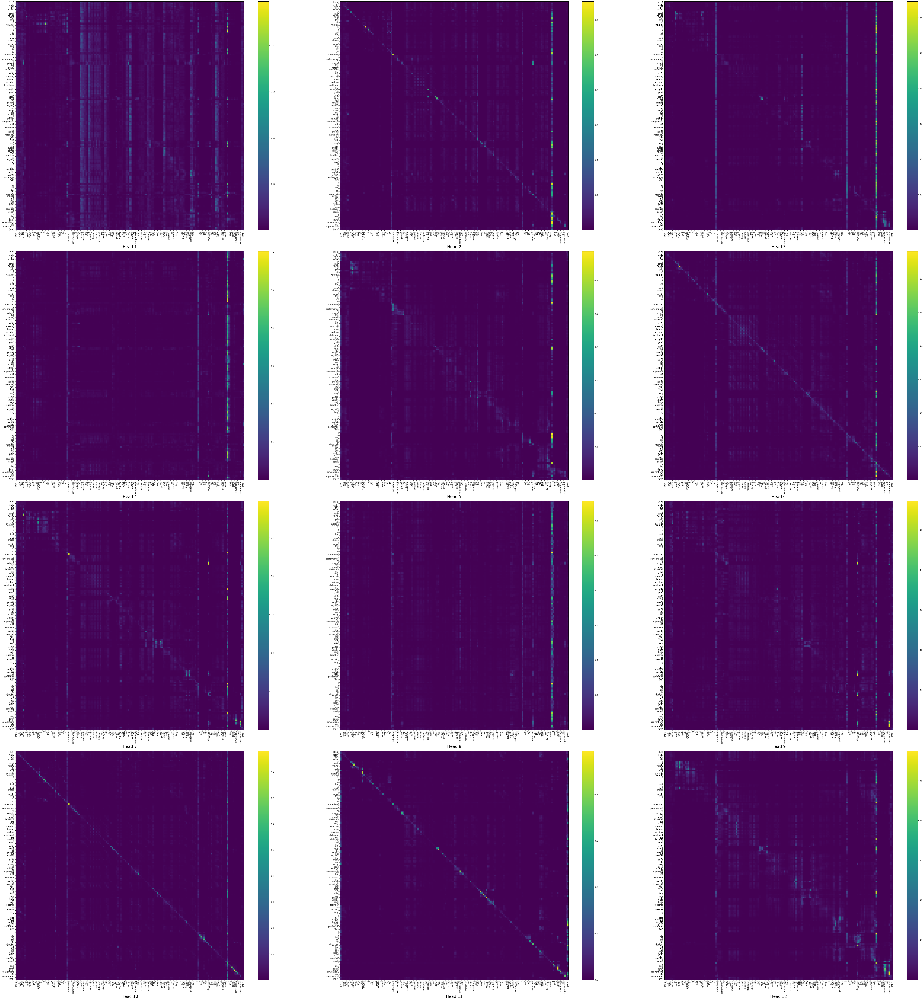

In [286]:
visualize_token2token_scores(output_attentions_all[layer].detach().cpu().numpy(), 0)

Let's examine the first row of the first head; i.e., the attention scores between the class token and words in the first head (of the last layer). 

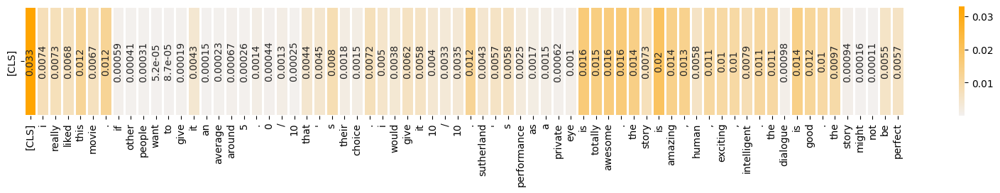

In [287]:
# only the first 70 tokens
plt.figure(figsize=(20,2))
sns.heatmap(first_attentions[2][11][0][0][0][:70].view(1,-1).cpu().detach().numpy(), annot=True, 
            cmap=sns.light_palette('orange', as_cmap=True), linewidths=1,
            xticklabels=all_tokens[:70], yticklabels=all_tokens[0:1], annot_kws={'rotation': 90})
plt.show()

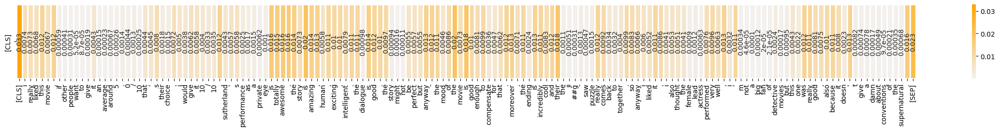

In [288]:
# all tokens
plt.figure(figsize=(30,2))
sns.heatmap(first_attentions[2][11][0][0][0][:len(all_tokens)].view(1,-1).cpu().detach().numpy(), annot=True, 
            cmap=sns.light_palette('orange', as_cmap=True), linewidths=1,
            xticklabels=all_tokens[:len(all_tokens)], yticklabels=all_tokens[0:1], annot_kws={'rotation': 90})
plt.show()